# Classification

### Summary of Notebook
#### Created by Charlie H. Apigian, PhD.  - Director of the Data Science Institute at MTSU
<br>

### Contents
- **Business Understanding**
    - Available resources, problems, goals
- **Data Understanding**
    - What data do you have available to you?
    - Install or Load tools or applications
        - Programming – Jupyter notebooks for Python or R Studio for R
        - BI/spreadsheets – Excel – PowerPivot - Tableau
    - Import or download the data
    - View, explore, and summarize the data
- **Data Preparation**
    - Cleanse the data - clean up null values, outliers, mistakes
    - Construct new data, transform or feature engineering
    - Integrate data
    - Format data (strings, integers, floats, etc.)
    - **For Supervised Learning, create X and Y**
- **Modeling** 
    - Split the data (Train/Test Split)
    - Setup models for machine learning/AI processes
    - Can also include developing the outline for visuals, dashboards or reports
- **Evaluation**
    - Create a report of the findings
- **Deployment of models**




# --------------------------------------------------------------------------------
# XXXXXXXXXXXXX  BUSINESS UNDERSTANDING XXXXXXXXXXXXX
# --------------------------------------------------------------------------------

## To Predict if a loan will be bad

# --------------------------------------------------------------------------------
# XXXXXXXXXXXXXXXXXX  DATA UNDERSTANDING XXXXXXXXXXXXX
# --------------------------------------------------------------------------------


## XXXXXXXXXXXXXXXXXX  Import Libraries XXXXXXXXXXXXXXXXXX


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns',500)
sns.set_style('whitegrid')


## XXXXXXXXXXXXXXXXXXX  Import Data XXXXXXXXXXXXXXXXXXX


### Import the data and create dataframes and arrays that can then be cleansed, transformed, and split.

In [2]:
df_loandata = pd.read_csv('LoanData_Cleansed.csv', index_col = 0, header = 0)
df_loandata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49856 entries, 0 to 49855
Data columns (total 26 columns):
loan_amnt                      49856 non-null int64
term                           49856 non-null int64
sub_grade                      49856 non-null int64
emp_length                     49856 non-null int64
annual_inc                     49856 non-null float64
delinq_2yrs                    49856 non-null int64
mths_since_last_delinq         49856 non-null float64
open_acc                       49856 non-null int64
pub_rec                        49856 non-null int64
revol_bal                      49856 non-null int64
total_acc                      49856 non-null float64
collections_12_mths_ex_med     49856 non-null int64
mths_since_last_major_derog    49856 non-null int64
acc_now_delinq                 49856 non-null int64
tot_coll_amt                   49856 non-null int64
tot_cur_debt                   49856 non-null int64
total_credit_rv                49856 non-null int64
M

# --------------------------------------------------------------------------------
# XXXXXXXXXXXXXXXXXX  DATA PREPARATION XXXXXXXXXXXXXXX
# --------------------------------------------------------------------------------

## Create your target dataset

In [3]:
y = df_loandata['loan_is_bad']
y.value_counts()

0    42100
1     7756
Name: loan_is_bad, dtype: int64

### Create you Feature Dataset

In [4]:
X = df_loandata.drop('loan_is_bad', axis = 1)
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49856 entries, 0 to 49855
Data columns (total 25 columns):
loan_amnt                      49856 non-null int64
term                           49856 non-null int64
sub_grade                      49856 non-null int64
emp_length                     49856 non-null int64
annual_inc                     49856 non-null float64
delinq_2yrs                    49856 non-null int64
mths_since_last_delinq         49856 non-null float64
open_acc                       49856 non-null int64
pub_rec                        49856 non-null int64
revol_bal                      49856 non-null int64
total_acc                      49856 non-null float64
collections_12_mths_ex_med     49856 non-null int64
mths_since_last_major_derog    49856 non-null int64
acc_now_delinq                 49856 non-null int64
tot_coll_amt                   49856 non-null int64
tot_cur_debt                   49856 non-null int64
total_credit_rv                49856 non-null int64
M

In [5]:
X.head()

,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal
0,7200,36,18,9,58000.0,0,26.0,6,0,3874,25.0,0,30,0,0,154930,4300,0,0,1,0,1,0,0,0
1,8000,36,7,10,64000.0,0,0.0,8,0,29797,22.0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
2,16000,36,5,4,55000.0,0,0.0,12,0,6840,38.0,0,0,0,0,29116,24800,0,0,1,0,1,0,0,0
3,35000,36,5,8,130000.0,0,0.0,11,0,23025,37.0,0,0,0,0,60019,55800,0,0,1,1,0,0,0,0
4,21000,36,0,10,120000.0,0,0.0,16,0,18641,35.0,0,0,0,0,37603,85031,0,0,1,0,1,0,0,0


## YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!

## You have create your X and y datasets.  You are ready to model and analyze.
 
## YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!YAY!

# --------------------------------------------------------------------------------
# XXXXXXXXXXXXXXXXXXX  MODELING XXXXXXXXXXXXXXXXXXXX
# --------------------------------------------------------------------------------

##  
## XXXXXXXXXXXXXXXXXXX  Split the Data XXXXXXXXXXXXXXXXXXX
##  

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [8]:
y_train.head()

6972     0
22341    1
2569     1
35251    0
44831    0
Name: loan_is_bad, dtype: int64

In [9]:
#y_train.values.reshape(-1,1)

## Feature Scaling
- StandardScaler
    - The StandardScaler assumes your data is normally distributed within each feature and will scale them such that the distribution is now centred around 0, with a standard deviation of 1.
    ![alt text](images/StandardScalar.png "Standard")
- MinMaxScaler
    - The MinMaxScaler is the probably the most famous scaling algorithm, and follows the following formula for each feature:
    ![alt text](images/MinMaxScalar.png "MinMax")
    

From http://benalexkeen.com/feature-scaling-with-scikit-learn/

In [10]:
X_train.head()

,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal
6972,22000,36,9,4,110000.0,0,54.0,13,0,7246,23.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
22341,19750,60,25,10,50000.0,2,10.0,18,0,11456,34.0,0,0,0,0,15521,21200,0,1,0,0,1,0,0,0
2569,6925,60,22,4,35000.0,0,0.0,9,0,5896,12.0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
35251,30000,60,20,10,115000.0,0,0.0,6,0,21756,32.0,0,0,0,0,382285,25900,0,1,0,0,1,0,0,0
44831,20675,36,2,8,237000.0,0,48.0,12,0,10855,26.0,0,0,0,0,644480,18200,1,0,0,0,1,0,0,0


In [11]:
scaler = StandardScaler()

X_train_sc = scaler.fit_transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)



X_test_sc = scaler.fit_transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

## To scale or not to scale?? Why after the split?

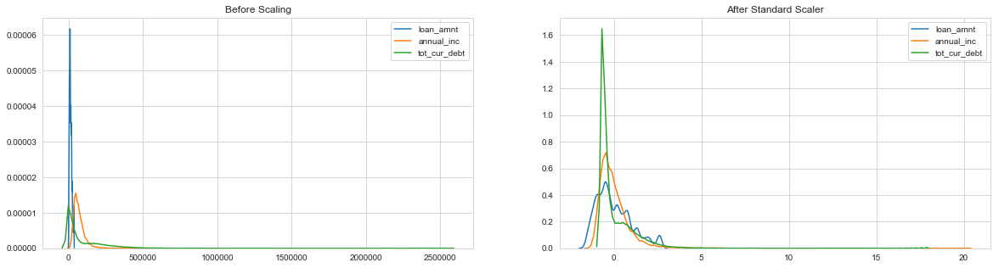

In [12]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 5))

ax1.set_title('Before Scaling')
sns.kdeplot(X_train['loan_amnt'], ax=ax1)
sns.kdeplot(X_train['annual_inc'], ax=ax1)
sns.kdeplot(X_train['tot_cur_debt'], ax=ax1)
ax2.set_title('After Standard Scaler')
sns.kdeplot(X_train_sc['loan_amnt'], ax=ax2)
sns.kdeplot(X_train_sc['annual_inc'], ax=ax2)
sns.kdeplot(X_train_sc['tot_cur_debt'], ax=ax2)
plt.show()

In [13]:
X_train_sc.head()

,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal
0,1.002470,-0.478777,-0.194817,-0.501279,0.847979,-0.339095,1.671324,0.439849,-0.214982,-0.544649,-0.116287,-0.03092,-0.357677,-0.022578,-0.06755,-0.682497,-0.801409,-0.994428,-0.291315,1.164189,-0.510866,0.823063,-0.10394,-0.226148,-0.399342
1,0.723962,2.088654,2.387014,1.191020,-0.453491,2.642529,-0.253218,1.538009,-0.214982,-0.281301,0.878843,-0.03092,-0.357677,-0.022578,-0.06755,-0.570435,0.020477,-0.994428,3.432713,-0.858967,-0.510866,0.823063,-0.10394,-0.226148,-0.399342
2,-0.863535,2.088654,1.902921,-0.501279,-0.778859,-0.339095,-0.690614,-0.438679,-0.214982,-0.629096,-1.111416,-0.03092,-0.357677,-0.022578,-0.06755,-0.682497,-0.801409,1.005603,-0.291315,-0.858967,-0.510866,0.823063,-0.10394,-0.226148,-0.399342
3,1.992721,2.088654,1.580192,1.191020,0.956434,-0.339095,-0.690614,-1.097574,-0.214982,0.362995,0.697910,-0.03092,-0.357677,-0.022578,-0.06755,2.077610,0.202688,-0.994428,3.432713,-0.858967,-0.510866,0.823063,-0.10394,-0.226148,-0.399342
4,0.838460,-0.478777,-1.324369,0.626920,3.602756,-0.339095,1.408886,0.220217,-0.214982,-0.318895,0.155112,-0.03092,-0.357677,-0.022578,-0.06755,3.970663,-0.095828,1.005603,-0.291315,-0.858967,-0.510866,0.823063,-0.10394,-0.226148,-0.399342


In [14]:
X_test_sc.head()

,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal
0,1.741819,2.069161,-0.838610,-1.343658,1.886068,-0.323045,-0.688942,0.658359,-0.207527,-0.484784,1.149331,-0.033733,-0.362534,-0.026992,-0.066628,-0.679350,-0.803136,1.009067,-0.281334,-0.870628,-0.504968,-1.227787,-0.096501,-0.228632,2.512755
1,0.136039,-0.483288,-0.678054,0.064293,-0.054975,-0.323045,-0.688942,-0.891315,-0.207527,0.829573,0.419717,-0.033733,-0.362534,-0.026992,-0.066628,-0.297796,0.413017,-0.991014,-0.281334,1.148597,1.980324,-1.227787,-0.096501,-0.228632,-0.397970
2,0.506603,-0.483288,1.569724,-1.343658,1.057574,-0.323045,2.376141,2.872178,-0.207527,-0.316476,2.334955,-0.033733,-0.362534,-0.026992,-0.066628,-0.679350,-0.803136,1.009067,-0.281334,-0.870628,1.980324,-1.227787,-0.096501,-0.228632,-0.397970
3,0.639389,-0.483288,0.606391,1.190654,-0.410043,2.652191,-0.251073,1.543886,-0.207527,0.988835,0.237313,-0.033733,1.000926,-0.026992,-0.066628,0.827693,0.728749,1.009067,-0.281334,-0.870628,-0.504968,0.814474,-0.096501,-0.228632,-0.397970
4,-0.728612,-0.483288,0.124724,-0.780478,-0.268016,2.652191,-0.426220,-0.227169,-0.207527,-0.562122,0.693322,-0.033733,3.312878,-0.026992,-0.066628,0.260432,-0.362670,-0.991014,-0.281334,1.148597,1.980324,-1.227787,-0.096501,-0.228632,-0.397970


##  
## XXXXXXXXXXXXXXX  Select and Run the Model XXXXXXXXXXXXXXX
##  

# XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
# Classification

## What are the steps?
- in every type of Machine Learning technique, you:
    - fit a model (.fit)
    - predict using the test data (.predict)
    - compare the results
        - confusion matrix
        - classification report

# XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


### Logistic Regression - Always start with Logistic Regression and then try to prove it wrong
using non-scaled data

In [15]:
loan_names=X_train.columns.values

In [16]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

In [17]:
#without weights
logr = LogisticRegression()
logr.fit(X_train, y_train)
score = logr.score(X_test, y_test)
print(score)
print("")
log_pred = logr.predict(X_test)
logexport_prob = logr.predict_proba(X_test)
print(confusion_matrix(y_test, log_pred))
print("")
print(classification_report(y_test, log_pred))

0.844554389249181

[[12632     0]
 [ 2325     0]]

              precision    recall  f1-score   support

           0       0.84      1.00      0.92     12632
           1       0.00      0.00      0.00      2325

   micro avg       0.84      0.84      0.84     14957
   macro avg       0.42      0.50      0.46     14957
weighted avg       0.71      0.84      0.77     14957



In [18]:
log_pred = pd.DataFrame(log_pred)
log_pred = log_pred.rename(columns = {0:'Predict_Log'})
logexport_prob = pd.DataFrame(logexport_prob)
logexport_prob = logexport_prob.rename(columns = {0:'Prob_NotBad', 1:'Prob_Bad'})

In [19]:
df_loan_results = pd.concat([X_test, y_test], axis = 1 )

In [20]:
df_loan_results.head()

,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal,loan_is_bad
9571,28000,60,5,1,150000.0,0,0.0,14,0,8316,37.0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
45844,15000,36,6,6,68000.0,0,0.0,7,0,28948,29.0,0,0,0,0,52374,31200,0,0,1,1,0,0,0,0,0
6348,18000,36,20,1,115000.0,0,70.0,24,0,10958,50.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
35836,19075,36,14,10,53000.0,2,10.0,18,0,31448,27.0,0,23,0,0,206864,39300,1,0,0,0,1,0,0,0,1
30359,8000,36,11,3,59000.0,2,6.0,10,0,7102,32.0,0,62,0,0,128999,11300,0,0,1,1,0,0,0,0,0


In [21]:
df_loan_results = df_loan_results.reset_index()
#df_bike_results = df_bike_results.drop(['index'], axis =1)

In [22]:
df_loan_results = pd.concat([df_loan_results, log_pred], axis = 1 )
df_loan_results = pd.concat([df_loan_results, logexport_prob], axis = 1 )

In [23]:
df_loan_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14957 entries, 0 to 14956
Data columns (total 30 columns):
index                          14957 non-null int64
loan_amnt                      14957 non-null int64
term                           14957 non-null int64
sub_grade                      14957 non-null int64
emp_length                     14957 non-null int64
annual_inc                     14957 non-null float64
delinq_2yrs                    14957 non-null int64
mths_since_last_delinq         14957 non-null float64
open_acc                       14957 non-null int64
pub_rec                        14957 non-null int64
revol_bal                      14957 non-null int64
total_acc                      14957 non-null float64
collections_12_mths_ex_med     14957 non-null int64
mths_since_last_major_derog    14957 non-null int64
acc_now_delinq                 14957 non-null int64
tot_coll_amt                   14957 non-null int64
tot_cur_debt                   14957 non-null int64
t

In [24]:
df_loan_results.head()

,index,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal,loan_is_bad,Predict_Log,Prob_NotBad,Prob_Bad
0,9571,28000,60,5,1,150000.0,0,0.0,14,0,8316,37.0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0.945676,0.054324
1,45844,15000,36,6,6,68000.0,0,0.0,7,0,28948,29.0,0,0,0,0,52374,31200,0,0,1,1,0,0,0,0,0,0,0.845412,0.154588
2,6348,18000,36,20,1,115000.0,0,70.0,24,0,10958,50.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0.890373,0.109627
3,35836,19075,36,14,10,53000.0,2,10.0,18,0,31448,27.0,0,23,0,0,206864,39300,1,0,0,0,1,0,0,0,1,0,0.765756,0.234244
4,30359,8000,36,11,3,59000.0,2,6.0,10,0,7102,32.0,0,62,0,0,128999,11300,0,0,1,1,0,0,0,0,0,0,0.844674,0.155326


##  
## XXXXXXXXXXXXXXXXX  Fine Tune the Model XXXXXXXXXXXXXXXXX
##  

### Logistic Regression w/ Scaler
#### Why balanced?
- Balanced class weights allow you to factor in unbalanced datasets
https://chrisalbon.com/machine_learning/logistic_regression/handling_imbalanced_classes_in_logistic_regression/

In [25]:
logrsc = LogisticRegression(class_weight = 'balanced')
logrsc.fit(X_train_sc, y_train)
score = logrsc.score(X_test_sc, y_test)
score

0.6350203917897974

In [26]:
scaled_pred = logrsc.predict(X_test_sc)

In [27]:
print(classification_report(y_test, scaled_pred))

              precision    recall  f1-score   support

           0       0.90      0.64      0.75     12632
           1       0.23      0.60      0.34      2325

   micro avg       0.64      0.64      0.64     14957
   macro avg       0.57      0.62      0.54     14957
weighted avg       0.79      0.64      0.68     14957



In [28]:
print(confusion_matrix(y_test, scaled_pred))

[[8109 4523]
 [ 936 1389]]


## Try manually setting class weights

In [29]:
logrsc = LogisticRegression(class_weight = {0:1, 1:3})
logrsc.fit(X_train_sc, y_train)
score = logrsc.score(X_test_sc, y_test)
score

0.7943437855184863

In [30]:
scaled_pred = logrsc.predict(X_test_sc)

In [31]:
print(classification_report(y_test, scaled_pred))

              precision    recall  f1-score   support

           0       0.86      0.90      0.88     12632
           1       0.29      0.23      0.26      2325

   micro avg       0.79      0.79      0.79     14957
   macro avg       0.58      0.56      0.57     14957
weighted avg       0.77      0.79      0.78     14957



In [32]:
print(confusion_matrix(y_test, scaled_pred))

[[11354  1278]
 [ 1798   527]]


### Decision Tree
![Decision-Tree-Algorithms.png](images/Decision-Tree-Algorithms.png)

In [33]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.tree import DecisionTreeClassifier

In [34]:
classifier=DecisionTreeClassifier()
classifier=classifier.fit(X_train,y_train)
score_tree = classifier.score(X_test, y_test)
score_tree

0.7400548238283078

In [35]:
df_loanpred = classifier.predict(X_test)
print("Confusion Matrix")
print(confusion_matrix(y_test, df_loanpred))
print("")
print("classification Report")
print(classification_report(y_test, df_loanpred))

Confusion Matrix
[[10527  2105]
 [ 1783   542]]

classification Report
              precision    recall  f1-score   support

           0       0.86      0.83      0.84     12632
           1       0.20      0.23      0.22      2325

   micro avg       0.74      0.74      0.74     14957
   macro avg       0.53      0.53      0.53     14957
weighted avg       0.75      0.74      0.75     14957



In [36]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.172553 to fit



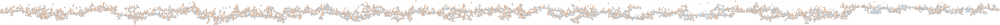

In [37]:
dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png()) 

In [38]:
#Using Decision Tree Classifier
clf2=DecisionTreeClassifier(max_depth=5, max_leaf_nodes=10)
clf2=clf2.fit(X_train,y_train)
clf2.score(X_test, y_test)

0.844554389249181

In [39]:
clf2

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=10,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

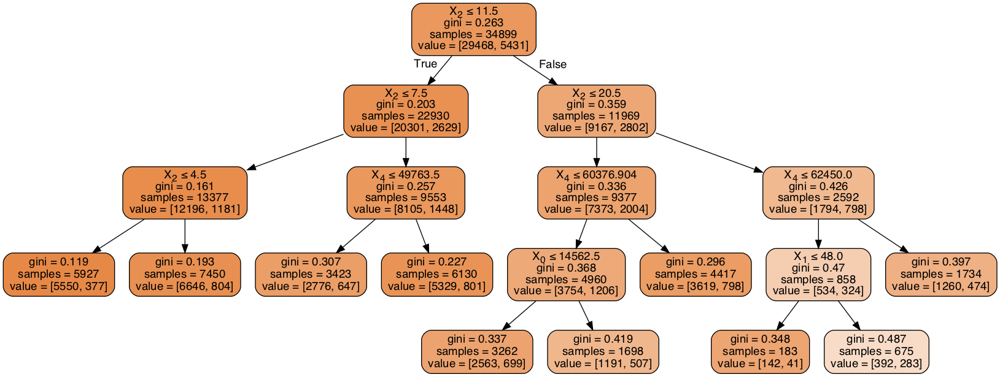

In [40]:
dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

iteration 1 done
iteration 2 done
iteration 3 done
iteration 4 done
iteration 5 done
iteration 6 done
iteration 7 done
iteration 8 done
iteration 9 done
iteration 10 done
iteration 11 done


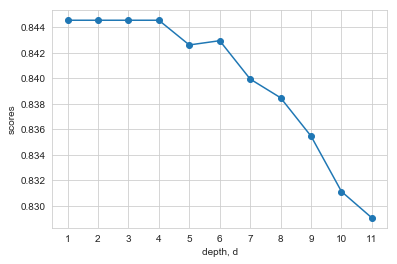

In [41]:
depth = range(1,12)
scores = []

for d in depth:
    classifier=DecisionTreeClassifier(max_depth = d)
    classifier=classifier.fit(X_train,y_train)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done".format(d))


plt.plot(depth, scores, '-o')
plt.xlabel('depth, d')
plt.ylabel('scores')
plt.xticks(depth)
plt.show()

In [68]:
clf3=DecisionTreeClassifier(max_depth =  6, max_leaf_nodes=10)
clf3=classifier.fit(X_train,y_train)
clf3.score(X_test, y_test)

0.8291101156649061

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.449781 to fit



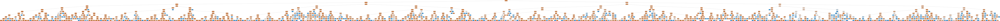

In [69]:
dot_data = StringIO()
export_graphviz(clf3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png()) 

In [70]:
df_loanpred3 = clf3.predict(X_test)
print("Confusion Matrix")
print(confusion_matrix(y_test, df_loanpred3))
print("")
print("classification Report")
print(classification_report(y_test, df_loanpred3))

Confusion Matrix
[[12276   356]
 [ 2200   125]]

classification Report
              precision    recall  f1-score   support

           0       0.85      0.97      0.91     12632
           1       0.26      0.05      0.09      2325

   micro avg       0.83      0.83      0.83     14957
   macro avg       0.55      0.51      0.50     14957
weighted avg       0.76      0.83      0.78     14957



## Notice above that it might be more accurate, but that does not mean it is better
#  

In [46]:
dt_fi = pd.DataFrame(classifier.feature_importances_)

In [47]:
names = pd.DataFrame(list(X.columns))
df_feat_imp = pd.concat([dt_fi, names], axis = 1)

In [48]:
df_feat_imp.columns = ['Importance', 'Features']
df_feat_imp.sort_values('Importance', ascending = False)

,Importance,Features
2,0.209330,sub_grade
9,0.125022,revol_bal
4,0.113844,annual_inc
0,0.088445,loan_amnt
16,0.081891,total_credit_rv
7,0.067068,open_acc
10,0.066188,total_acc
15,0.058861,tot_cur_debt
6,0.038901,mths_since_last_delinq
3,0.035603,emp_length


In [49]:
df_loanpred = pd.DataFrame(df_loanpred)

In [50]:
df_loan_results = pd.concat([df_loan_results, df_loanpred], axis = 1 )

In [51]:
df_loan_results.head()

,index,loan_amnt,term,sub_grade,emp_length,annual_inc,delinq_2yrs,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_debt,total_credit_rv,MORTGAGE,OWN,RENT,credit_card,debt_consolidation,medical,other,personal,loan_is_bad,Predict_Log,Prob_NotBad,Prob_Bad,0
0,9571,28000,60,5,1,150000.0,0,0.0,14,0,8316,37.0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0.945676,0.054324,0
1,45844,15000,36,6,6,68000.0,0,0.0,7,0,28948,29.0,0,0,0,0,52374,31200,0,0,1,1,0,0,0,0,0,0,0.845412,0.154588,0
2,6348,18000,36,20,1,115000.0,0,70.0,24,0,10958,50.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0.890373,0.109627,1
3,35836,19075,36,14,10,53000.0,2,10.0,18,0,31448,27.0,0,23,0,0,206864,39300,1,0,0,0,1,0,0,0,1,0,0.765756,0.234244,0
4,30359,8000,36,11,3,59000.0,2,6.0,10,0,7102,32.0,0,62,0,0,128999,11300,0,0,1,1,0,0,0,0,0,0,0.844674,0.155326,0


### Random Forest
![Ensemble-Algorithms.png](images/Ensemble-Algorithms.png)

In [52]:
from sklearn.ensemble import RandomForestClassifier

In [53]:
rf = RandomForestClassifier(n_estimators = 90, max_depth = 10)
rf = rf.fit(X_train, y_train)
score = rf.score(X_test, y_test)
print(score)
rf_pred = rf.predict(X_test)
print(classification_report(y_test, rf_pred))

0.844554389249181
              precision    recall  f1-score   support

           0       0.84      1.00      0.92     12632
           1       0.00      0.00      0.00      2325

   micro avg       0.84      0.84      0.84     14957
   macro avg       0.42      0.50      0.46     14957
weighted avg       0.71      0.84      0.77     14957



In [54]:
print(confusion_matrix(y_test, rf_pred))

[[12632     0]
 [ 2325     0]]


In [55]:
rf = RandomForestClassifier(n_estimators = 90, max_depth = 10)
rf = rf.fit(X_train_sc, y_train)
score = rf.score(X_test_sc, y_test)
print(score)
rf_pred1 = rf.predict(X_test_sc)
print(classification_report(y_test, rf_pred1))

0.844554389249181
              precision    recall  f1-score   support

           0       0.84      1.00      0.92     12632
           1       0.00      0.00      0.00      2325

   micro avg       0.84      0.84      0.84     14957
   macro avg       0.42      0.50      0.46     14957
weighted avg       0.71      0.84      0.77     14957



In [56]:
print(confusion_matrix(y_test, rf_pred1))

[[12632     0]
 [ 2325     0]]


In [57]:
fi = pd.DataFrame(rf.feature_importances_)

In [58]:
columns = pd.DataFrame(list(X.columns))

In [59]:
features = pd.concat([columns, fi], axis = 1)
features.columns = ['Feature', 'Importance']

In [60]:
features.sort_values("Importance", ascending = False)

,Feature,Importance
2,sub_grade,0.213388
4,annual_inc,0.108420
9,revol_bal,0.088286
0,loan_amnt,0.084823
16,total_credit_rv,0.071706
15,tot_cur_debt,0.067803
10,total_acc,0.059530
7,open_acc,0.055866
1,term,0.047574
6,mths_since_last_delinq,0.043264


In [61]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

In [62]:
# Create a pipeline
pipe = Pipeline([('classifier', RandomForestClassifier())])

# Create space of candidate learning algorithms and their hyperparameters
search_space = [{'classifier': [LogisticRegression()],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(0, 4, 10)},
                {'classifier': [RandomForestClassifier()],
                 'classifier__n_estimators': [10, 100, 1000],
                 'classifier__max_features': [1, 2, 3]}]

In [63]:
# Create grid search 
clf_best = GridSearchCV(pipe, search_space, cv=5, verbose=0)

In [64]:
# Fit grid search
best_model = clf_best.fit(X_train, y_train)

In [65]:
# View best model
best_model.best_estimator_.get_params()['classifier']

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=3, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [66]:
best_model.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

In [67]:
score = best_model.score(X_test, y_test)
print("Accuracy Score")
print(score)
best_model_pred = best_model.predict(X_test)
print("")
print("Confusion Matrix")
print(confusion_matrix(y_test, best_model_pred))
print("")
print("Confusion Matrix")
print(classification_report(y_test, best_model_pred))

Accuracy Score
0.8439526643043391

Confusion Matrix
[[12611    21]
 [ 2313    12]]

Confusion Matrix
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     12632
           1       0.36      0.01      0.01      2325

   micro avg       0.84      0.84      0.84     14957
   macro avg       0.60      0.50      0.46     14957
weighted avg       0.77      0.84      0.77     14957

